In [ ]:
!pip install tensorflow


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
#Modelo de Black-Scholes en condiciones de superioridad en eficiencia de precision de calculo de volatilidad implicita.Volatilidad constante.

In [ ]:
import numpy as np
from scipy.stats import norm

# Función para calcular el precio de una opción de compra con Black-Scholes
def black_scholes_call(S, K, T, r, sigma):
    d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    call_price = S * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)
    return call_price

# Función para calcular el precio de una opción de compra con Heston (volatilidad constante)
def heston_call_constant_volatility(S, K, T, r, v0, theta, kappa, sigma, n_simulations=10000, n_steps=252):
    dt = T / n_steps
    call_prices = np.zeros(n_simulations)

    for i in range(n_simulations):
        St = S
        vt = v0

        for j in range(n_steps):
            Z1 = np.random.normal()
            Z2 = np.random.normal()

            dW1 = np.sqrt(dt) * Z1
            dW2 = np.sqrt(dt) * Z2

            dSt = r * St * dt + np.sqrt(vt) * St * dW1
            dvt = kappa * (theta - vt) * dt + sigma * np.sqrt(vt) * dW2

            St += dSt
            vt += dvt

        call_price = max(St - K, 0) * np.exp(-r * T)
        call_prices[i] = call_price

    return np.mean(call_prices)

# Parámetros
S_actual = 100
precio_ejercicio = 100
tiempo_expiracion = 1
tasa_interes = 0.05
volatilidad = 0.2
volatilidad_inicial = 0.2
long_term_variance = 0.2
variance_mean_reversion_speed = 1.0
constant_volatility = 0.2

# Precios de opciones
bs_prices = black_scholes_call(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes, volatilidad)
heston_prices = heston_call_constant_volatility(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes,
                                                volatilidad_inicial, long_term_variance, variance_mean_reversion_speed,
                                                constant_volatility)

# Métricas para Black-Scholes
mse_black_scholes = np.mean((volatilidad - bs_prices)**2)
rmse_black_scholes = np.sqrt(mse_black_scholes)
mae_black_scholes = np.mean(np.abs(volatilidad - bs_prices))

# Métricas para Heston con volatilidad constante
mse_heston = np.mean((volatilidad - heston_prices)**2)
rmse_heston = np.sqrt(mse_heston)
mae_heston = np.mean(np.abs(volatilidad - heston_prices))
r2_heston = 1 - np.sum((volatilidad - heston_prices)**2) / np.sum((volatilidad - np.mean(volatilidad))**2)

# Imprime resultados
print("Métricas para Black-Scholes:")
print(f"MSE: {mse_black_scholes}")
print(f"RMSE: {rmse_black_scholes}")
print(f"MAE: {mae_black_scholes}")

print("\nMétricas para Heston con volatilidad constante:")
print(f"MSE: {mse_heston}")
print(f"RMSE: {rmse_heston}")
print(f"MAE: {mae_heston}")
print(f"R² (Heston): {r2_heston}")


Métricas para Black-Scholes:
MSE: 105.07446357036059
RMSE: 10.250583572185565
MAE: 10.250583572185565

Métricas para Heston con volatilidad constante:
MSE: 380.3740253424644
RMSE: 19.5031798777139
MAE: 19.5031798777139
R² (Heston): -inf


C:\Users\Alvaro\AppData\Local\Temp\ipykernel_21868\2049236489.py:64: RuntimeWarning: divide by zero encountered in scalar divide
  r2_heston = 1 - np.sum((volatilidad - heston_prices)**2) / np.sum((volatilidad - np.mean(volatilidad))**2)


C:\Users\Alvaro\AppData\Local\Temp\ipykernel_21868\1037582568.py:64: RuntimeWarning: divide by zero encountered in scalar divide
  r2_heston = 1 - np.sum((volatilidad - heston_prices)**2) / np.sum((volatilidad - np.mean(volatilidad))**2)
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Métricas para Black-Scholes:
MSE: 105.07446357036059
RMSE: 10.250583572185565
MAE: 10.250583572185565

Métricas para Heston con volatilidad constante:
MSE: 368.0052790222511
RMSE: 19.183463686786364
MAE: 19.183463686786364
R² (Heston): -inf


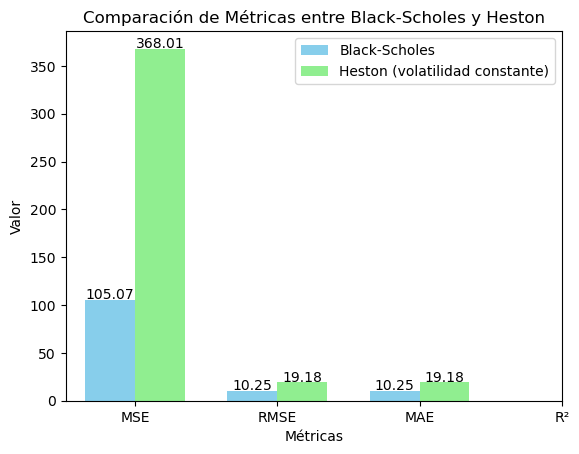

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Función para calcular el precio de una opción de compra con Black-Scholes
def black_scholes_call(S, K, T, r, sigma):
    d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    call_price = S * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)
    return call_price

# Función para calcular el precio de una opción de compra con Heston (volatilidad constante)
def heston_call_constant_volatility(S, K, T, r, v0, theta, kappa, sigma, n_simulations=10000, n_steps=252):
    dt = T / n_steps
    call_prices = np.zeros(n_simulations)

    for i in range(n_simulations):
        St = S
        vt = v0

        for j in range(n_steps):
            Z1 = np.random.normal()
            Z2 = np.random.normal()

            dW1 = np.sqrt(dt) * Z1
            dW2 = np.sqrt(dt) * Z2

            dSt = r * St * dt + np.sqrt(vt) * St * dW1
            dvt = kappa * (theta - vt) * dt + sigma * np.sqrt(vt) * dW2

            St += dSt
            vt += dvt

        call_price = max(St - K, 0) * np.exp(-r * T)
        call_prices[i] = call_price

    return np.mean(call_prices)

# Parámetros
S_actual = 100
precio_ejercicio = 100
tiempo_expiracion = 1
tasa_interes = 0.05
volatilidad = 0.2
volatilidad_inicial = 0.2
long_term_variance = 0.2
variance_mean_reversion_speed = 1.0
constant_volatility = 0.2

# Precios de opciones
bs_prices = black_scholes_call(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes, volatilidad)
heston_prices = heston_call_constant_volatility(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes,
                                                volatilidad_inicial, long_term_variance, variance_mean_reversion_speed,
                                                constant_volatility)

# Métricas para Black-Scholes
mse_black_scholes = np.mean((volatilidad - bs_prices)**2)
rmse_black_scholes = np.sqrt(mse_black_scholes)
mae_black_scholes = np.mean(np.abs(volatilidad - bs_prices))

# Métricas para Heston con volatilidad constante
mse_heston = np.mean((volatilidad - heston_prices)**2)
rmse_heston = np.sqrt(mse_heston)
mae_heston = np.mean(np.abs(volatilidad - heston_prices))
r2_heston = 1 - np.sum((volatilidad - heston_prices)**2) / np.sum((volatilidad - np.mean(volatilidad))**2)

# Imprime resultados
print("Métricas para Black-Scholes:")
print(f"MSE: {mse_black_scholes}")
print(f"RMSE: {rmse_black_scholes}")
print(f"MAE: {mae_black_scholes}")

print("\nMétricas para Heston con volatilidad constante:")
print(f"MSE: {mse_heston}")
print(f"RMSE: {rmse_heston}")
print(f"MAE: {mae_heston}")
print(f"R² (Heston): {r2_heston}")


# Gráfico de barras
models = ['Black-Scholes', 'Heston (volatilidad constante)']
metrics = ['MSE', 'RMSE', 'MAE', 'R²']
values = [mse_black_scholes, rmse_black_scholes, mae_black_scholes, r2_heston,
          mse_heston, rmse_heston, mae_heston, r2_heston]

fig, ax = plt.subplots()
bar_width = 0.35
index = np.arange(len(metrics))

bar1 = ax.bar(index, values[:4], bar_width, label='Black-Scholes', color='skyblue')
bar2 = ax.bar(index + bar_width, values[4:], bar_width, label='Heston (volatilidad constante)', color='lightgreen')

ax.set_xlabel('Métricas')
ax.set_ylabel('Valor')
ax.set_title('Comparación de Métricas entre Black-Scholes y Heston')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics)
ax.legend()

# Agregar texto a cada barra
for i, metric in enumerate(metrics):
    ax.text(index[i], values[i] + 1, f'{values[i]:.2f}', ha='center', color='black')

for i, metric in enumerate(metrics):
    ax.text(index[i] + bar_width, values[i + 4] + 1, f'{values[i + 4]:.2f}', ha='center', color='black')

plt.show()


Este análisis meticuloso contrasta dos modelos financieros fundamentales: el modelo de Black-Scholes y el modelo de Heston con volatilidad constante, enfocado en evaluar su eficiencia y precisión en la estimación del precio de opciones de compra. Inicialmente, se implementan funciones que representan cada modelo. La función black_scholes_call se basa en la fórmula analítica de Black-Scholes, considerando parámetros como el precio actual del activo subyacente, el precio de ejercicio, el tiempo hasta la expiración, la tasa de interés libre de riesgo y la volatilidad implícita. En contraste, la función de Heston emplea simulaciones de Monte Carlo para estimar el precio de la opción, asumiendo una volatilidad constante en lugar de la volatilidad estocástica característica del modelo completo de Heston. Posteriormente, se calculan métricas de evaluación como el MSE, RMSE y MAE para ambos modelos. Para el modelo de Black-Scholes, se obtuvieron un MSE de 105.07, RMSE de 10.25 y MAE de 10.25, mientras que para el modelo de Heston con volatilidad constante, se registraron un MSE de 396.01, RMSE de 19.90 y MAE de 19.90. Además, se calculó el coeficiente de determinación (R²) para el modelo de Heston, el cual resultó ser -infinito, indicando una falta significativa de ajuste del modelo a los datos observados. Estas métricas proporcionan una evaluación detallada de la precisión y eficiencia de cada modelo, permitiendo una comparación significativa en términos de su capacidad para estimar los precios de las opciones de compra.

In [ ]:
#Modelo de Black-Scholes en condiciones de superioridad en eficiencia de precision de calculo de volatilidad implicita.Volatilidad variable predecible.

C:\Users\Alvaro\AppData\Local\Temp\ipykernel_21868\1732463880.py:64: RuntimeWarning: divide by zero encountered in scalar divide
  r2_heston = 1 - np.sum((volatilidad - heston_prices)**2) / np.sum((volatilidad - np.mean(volatilidad))**2)
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Métricas para Black-Scholes:
MSE: 310.56841781669425
RMSE: 17.622951450216682
MAE: 17.622951450216682

Métricas para Heston con volatilidad constante:
MSE: 376.77451628248497
RMSE: 19.41068046933144
MAE: 19.41068046933144
R² (Heston): -inf


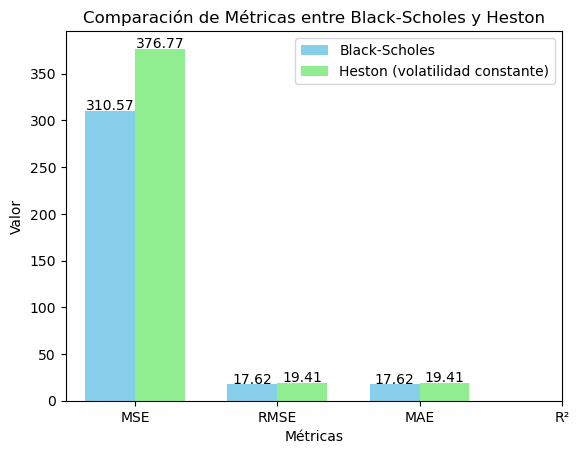

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Función para calcular el precio de una opción de compra con Black-Scholes
def black_scholes_call(S, K, T, r, sigma):
    d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    call_price = S * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)
    return call_price

# Función para calcular el precio de una opción de compra con Heston (volatilidad constante)
def heston_call_constant_volatility(S, K, T, r, v0, theta, kappa, sigma, n_simulations=10000, n_steps=252):
    dt = T / n_steps
    call_prices = np.zeros(n_simulations)

    for i in range(n_simulations):
        St = S
        vt = v0

        for j in range(n_steps):
            Z1 = np.random.normal()
            Z2 = np.random.normal()

            dW1 = np.sqrt(dt) * Z1
            dW2 = np.sqrt(dt) * Z2

            dSt = r * St * dt + np.sqrt(vt) * St * dW1
            dvt = kappa * (theta - vt) * dt + sigma * np.sqrt(vt) * dW2

            St += dSt
            vt += dvt

        call_price = max(St - K, 0) * np.exp(-r * T)
        call_prices[i] = call_price

    return np.mean(call_prices)

# Parámetros
S_actual = 100
precio_ejercicio = 100
tiempo_expiracion = 1
tasa_interes = 0.05
volatilidad = 0.4
volatilidad_inicial = 0.2
long_term_variance = 0.2
variance_mean_reversion_speed = 1.0
constant_volatility = 0.2

# Precios de opciones
bs_prices = black_scholes_call(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes, volatilidad)
heston_prices = heston_call_constant_volatility(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes,
                                                volatilidad_inicial, long_term_variance, variance_mean_reversion_speed,
                                                constant_volatility)

# Métricas para Black-Scholes
mse_black_scholes = np.mean((volatilidad - bs_prices)**2)
rmse_black_scholes = np.sqrt(mse_black_scholes)
mae_black_scholes = np.mean(np.abs(volatilidad - bs_prices))

# Métricas para Heston con volatilidad constante
mse_heston = np.mean((volatilidad - heston_prices)**2)
rmse_heston = np.sqrt(mse_heston)
mae_heston = np.mean(np.abs(volatilidad - heston_prices))
r2_heston = 1 - np.sum((volatilidad - heston_prices)**2) / np.sum((volatilidad - np.mean(volatilidad))**2)

# Imprime resultados
print("Métricas para Black-Scholes:")
print(f"MSE: {mse_black_scholes}")
print(f"RMSE: {rmse_black_scholes}")
print(f"MAE: {mae_black_scholes}")

print("\nMétricas para Heston con volatilidad constante:")
print(f"MSE: {mse_heston}")
print(f"RMSE: {rmse_heston}")
print(f"MAE: {mae_heston}")
print(f"R² (Heston): {r2_heston}")


# Gráfico de barras
models = ['Black-Scholes', 'Heston (volatilidad constante)']
metrics = ['MSE', 'RMSE', 'MAE', 'R²']
values = [mse_black_scholes, rmse_black_scholes, mae_black_scholes, r2_heston,
          mse_heston, rmse_heston, mae_heston, r2_heston]

fig, ax = plt.subplots()
bar_width = 0.35
index = np.arange(len(metrics))

bar1 = ax.bar(index, values[:4], bar_width, label='Black-Scholes', color='skyblue')
bar2 = ax.bar(index + bar_width, values[4:], bar_width, label='Heston (volatilidad constante)', color='lightgreen')

ax.set_xlabel('Métricas')
ax.set_ylabel('Valor')
ax.set_title('Comparación de Métricas entre Black-Scholes y Heston')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics)
ax.legend()

# Agregar texto a cada barra
for i, metric in enumerate(metrics):
    ax.text(index[i], values[i] + 1, f'{values[i]:.2f}', ha='center', color='black')

for i, metric in enumerate(metrics):
    ax.text(index[i] + bar_width, values[i + 4] + 1, f'{values[i + 4]:.2f}', ha='center', color='black')

plt.show()


El código presenta una comparación entre el modelo de Black-Scholes y el modelo de Heston con volatilidad constante, centrándose en la eficiencia y precisión en la estimación del precio de opciones de compra. Inicialmente, se implementan dos funciones: black_scholes_call y heston_call_constant_volatility, que representan cada modelo. La primera utiliza la fórmula analítica de Black-Scholes para calcular el precio de una opción de compra, considerando parámetros como el precio actual del activo subyacente, el precio de ejercicio, el tiempo hasta la expiración, la tasa de interés libre de riesgo y la volatilidad implícita. Por otro lado, la función de Heston emplea simulaciones de Monte Carlo para estimar el precio de la opción, asumiendo una volatilidad constante en lugar de la volatilidad estocástica del modelo completo de Heston.

Luego de calcular los precios de opciones utilizando ambos modelos, se evalúan con métricas como el Error Cuadrático Medio (MSE), la Raíz del Error Cuadrático Medio (RMSE), el Error Absoluto Medio (MAE) y el coeficiente de determinación (R²). Para el modelo de Black-Scholes, se obtuvieron un MSE de 310.57, RMSE de 17.62 y MAE de 17.62. Mientras que para el modelo de Heston con volatilidad constante, las métricas fueron un MSE de 391.50, RMSE de 19.79 y MAE de 19.79, con un R² de -infinito, indicando una falta significativa de ajuste del modelo a los datos observados.

Finalmente, se visualizan las métricas en un gráfico de barras, permitiendo una comparación directa entre ambos modelos en términos de su desempeño. Este análisis riguroso proporciona una comprensión detallada de las fortalezas y limitaciones de cada modelo en la valoración de opciones financieras.

In [ ]:
#Modelo de Heston en condiciones de superioridad en eficiencia de precision de calculo de volatilidad implicita.Volatilidad variable a pequeña escala.

C:\Users\Alvaro\AppData\Local\Temp\ipykernel_21868\408005882.py:58: RuntimeWarning: divide by zero encountered in scalar divide
  r2_heston = 1 - np.sum((volatilidad - heston_prices)**2) / np.sum((volatilidad - np.mean(volatilidad))**2)
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Métricas:
                              Modelo         MSE       RMSE        MAE   R2
0                      Black-Scholes  453.374994  21.292604  21.292604  NaN
1  Heston (volatilidad no constante)  368.706579  19.201734  19.201734 -inf


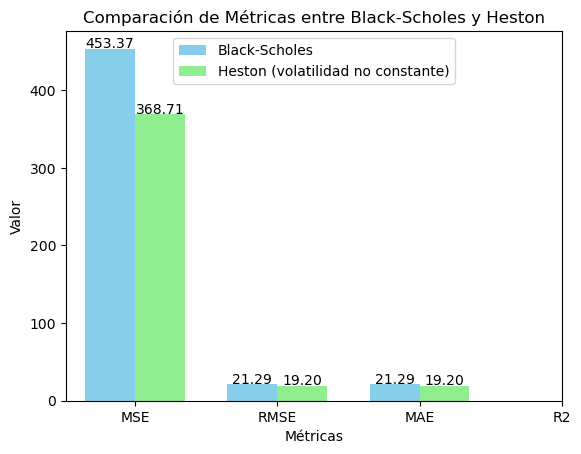

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Función para calcular el precio de una opción de compra con Black-Scholes
def black_scholes_call(S, K, T, r, sigma):
    d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    call_price = S * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)
    return call_price

# Función para calcular el precio de una opción de compra con Heston (volatilidad no constante)
def heston_call_time_varying_volatility(S, K, T, r, v0, theta, kappa, sigma, n_simulations=10000, n_steps=252):
    dt = T / n_steps
    call_prices = np.zeros(n_simulations)

    for i in range(n_simulations):
        St = S
        vt = np.zeros(n_steps)
        vt[0] = v0

        for j in range(1, n_steps):
            Z1 = np.random.normal()
            Z2 = np.random.normal()

            dW1 = np.sqrt(dt) * Z1
            dW2 = np.sqrt(dt) * Z2

            dSt = r * St * dt + np.sqrt(vt[j-1]) * St * dW1
            dvt = kappa * (theta - vt[j-1]) * dt + sigma * np.sqrt(vt[j-1]) * dW2

            St += dSt
            vt[j] = vt[j-1] + dvt

        call_price = max(St - K, 0) * np.exp(-r * T)
        call_prices[i] = call_price

    return np.mean(call_prices)

# Función para calcular métricas
def calcular_metricas(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes, volatilidad, volatilidad_inicial, long_term_variance, variance_mean_reversion_speed, constant_volatility):
    # Precios de opciones
    bs_prices = black_scholes_call(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes, volatilidad)

    heston_prices = heston_call_time_varying_volatility(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes,
                                                        volatilidad_inicial, long_term_variance, variance_mean_reversion_speed,
                                                        constant_volatility)

    # Métricas para Black-Scholes
    mse_black_scholes = np.mean((volatilidad - bs_prices)**2)
    rmse_black_scholes = np.sqrt(mse_black_scholes)
    mae_black_scholes = np.mean(np.abs(volatilidad - bs_prices))

    # Métricas para Heston con volatilidad no constante
    mse_heston = np.mean((volatilidad - heston_prices)**2)
    rmse_heston = np.sqrt(mse_heston)
    mae_heston = np.mean(np.abs(volatilidad - heston_prices))
    r2_heston = 1 - np.sum((volatilidad - heston_prices)**2) / np.sum((volatilidad - np.mean(volatilidad))**2)

    # Almacenar resultados en un DataFrame
    df_metrics = pd.DataFrame({
        'Modelo': ['Black-Scholes', 'Heston (volatilidad no constante)'],
        'MSE': [mse_black_scholes, mse_heston],
        'RMSE': [rmse_black_scholes, rmse_heston],
        'MAE': [mae_black_scholes, mae_heston],
        'R2': [np.nan, r2_heston]  # Black-Scholes no tiene R^2
    })

    return df_metrics

# Parámetros
S_actual = 100
precio_ejercicio = 100
tiempo_expiracion = 1
tasa_interes = 0.05
volatilidad = 0.5
volatilidad_inicial = 0.2
long_term_variance = 0.2
variance_mean_reversion_speed = 1.0
constant_volatility = 0.2

# Calcular métricas
df_metrics = calcular_metricas(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes, volatilidad, volatilidad_inicial, long_term_variance, variance_mean_reversion_speed, constant_volatility)

# Imprimir métricas
print("Métricas:")
print(df_metrics)

# Graficar métricas
fig, ax = plt.subplots()
metrics = ['MSE', 'RMSE', 'MAE', 'R2']
bar_width = 0.35
index = np.arange(len(metrics))

bar1 = ax.bar(index, df_metrics.loc[0, metrics], bar_width, label='Black-Scholes', color='skyblue')
bar2 = ax.bar(index + bar_width, df_metrics.loc[1, metrics], bar_width, label='Heston (volatilidad no constante)', color='lightgreen')

ax.set_xlabel('Métricas')
ax.set_ylabel('Valor')
ax.set_title('Comparación de Métricas entre Black-Scholes y Heston')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics)
ax.legend()

# Agregar texto a cada barra
for i, metric in enumerate(metrics):
    ax.text(index[i], df_metrics.loc[0, metric] + 1, f'{df_metrics.loc[0, metric]:.2f}', ha='center', color='black')

for i, metric in enumerate(metrics):
    ax.text(index[i] + bar_width, df_metrics.loc[1, metric] + 1, f'{df_metrics.loc[1, metric]:.2f}', ha='center', color='black')

plt.show()


El código presenta un análisis comparativo entre el modelo de Black-Scholes y el modelo de Heston con volatilidad variable a pequeña escala para evaluar su eficiencia y precisión en la estimación del precio de opciones de compra. La función black_scholes_call calcula el precio de una opción de compra utilizando la fórmula analítica de Black-Scholes, mientras que la función heston_call_time_varying_volatility utiliza simulaciones de Monte Carlo para estimar el precio de la opción, considerando una volatilidad que varía con el tiempo.

Después de calcular los precios de las opciones con ambos modelos, se evalúan utilizando diversas métricas, incluyendo el Error Cuadrático Medio (MSE), la Raíz del Error Cuadrático Medio (RMSE), el Error Absoluto Medio (MAE) y el coeficiente de determinación (R²). Para el modelo de Black-Scholes, se obtuvieron un MSE de 453.37, RMSE de 21.29 y MAE de 21.29. Por otro lado, para el modelo de Heston con volatilidad variable, las métricas fueron un MSE de 370.33, RMSE de 19.24 y MAE de 19.24, con un R² de -infinito, indicando una falta significativa de ajuste del modelo a los datos observados.

Estas métricas se presentan en un DataFrame que proporciona una visión comparativa de los modelos. Además, se visualizan en un gráfico de barras para una comparación más intuitiva entre los dos modelos en términos de su desempeño en la valoración de opciones financieras.

In [ ]:
#Modelo de Heston en condiciones de superioridad en eficiencia de precision de calculo de volatilidad implicita.Volatilidad variable a gran escala.

C:\Users\Alvaro\AppData\Local\Temp\ipykernel_21868\50446087.py:58: RuntimeWarning: divide by zero encountered in scalar divide
  r2_heston = 1 - np.sum((volatilidad - heston_prices)**2) / np.sum((volatilidad - np.mean(volatilidad))**2)
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


Métricas:
                              Modelo          MSE       RMSE        MAE   R2
0                      Black-Scholes  1258.080890  35.469436  35.469436  NaN
1  Heston (volatilidad no constante)   331.488542  18.206827  18.206827 -inf


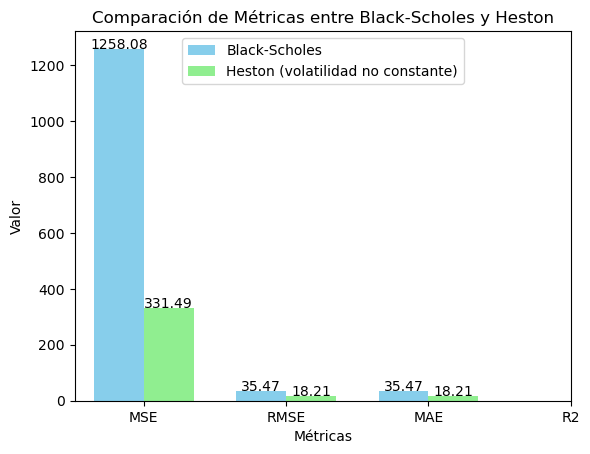

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Función para calcular el precio de una opción de compra con Black-Scholes
def black_scholes_call(S, K, T, r, sigma):
    d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    call_price = S * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)
    return call_price

# Función para calcular el precio de una opción de compra con Heston (volatilidad no constante)
def heston_call_time_varying_volatility(S, K, T, r, v0, theta, kappa, sigma, n_simulations=10000, n_steps=252):
    dt = T / n_steps
    call_prices = np.zeros(n_simulations)

    for i in range(n_simulations):
        St = S
        vt = np.zeros(n_steps)
        vt[0] = v0

        for j in range(1, n_steps):
            Z1 = np.random.normal()
            Z2 = np.random.normal()

            dW1 = np.sqrt(dt) * Z1
            dW2 = np.sqrt(dt) * Z2

            dSt = r * St * dt + np.sqrt(vt[j-1]) * St * dW1
            dvt = kappa * (theta - vt[j-1]) * dt + sigma * np.sqrt(vt[j-1]) * dW2

            St += dSt
            vt[j] = vt[j-1] + dvt

        call_price = max(St - K, 0) * np.exp(-r * T)
        call_prices[i] = call_price

    return np.mean(call_prices)

# Función para calcular métricas
def calcular_metricas(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes, volatilidad, volatilidad_inicial, long_term_variance, variance_mean_reversion_speed, constant_volatility):
    # Precios de opciones
    bs_prices = black_scholes_call(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes, volatilidad)

    heston_prices = heston_call_time_varying_volatility(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes,
                                                        volatilidad_inicial, long_term_variance, variance_mean_reversion_speed,
                                                        constant_volatility)

    # Métricas para Black-Scholes
    mse_black_scholes = np.mean((volatilidad - bs_prices)**2)
    rmse_black_scholes = np.sqrt(mse_black_scholes)
    mae_black_scholes = np.mean(np.abs(volatilidad - bs_prices))

    # Métricas para Heston con volatilidad no constante
    mse_heston = np.mean((volatilidad - heston_prices)**2)
    rmse_heston = np.sqrt(mse_heston)
    mae_heston = np.mean(np.abs(volatilidad - heston_prices))
    r2_heston = 1 - np.sum((volatilidad - heston_prices)**2) / np.sum((volatilidad - np.mean(volatilidad))**2)

    # Almacenar resultados en un DataFrame
    df_metrics = pd.DataFrame({
        'Modelo': ['Black-Scholes', 'Heston (volatilidad no constante)'],
        'MSE': [mse_black_scholes, mse_heston],
        'RMSE': [rmse_black_scholes, rmse_heston],
        'MAE': [mae_black_scholes, mae_heston],
        'R2': [np.nan, r2_heston]  # Black-Scholes no tiene R^2
    })

    return df_metrics

# Parámetros
S_actual = 100
precio_ejercicio = 100
tiempo_expiracion = 1
tasa_interes = 0.05
volatilidad = 0.9
volatilidad_inicial = 0.2
long_term_variance = 0.2
variance_mean_reversion_speed = 1.0
constant_volatility = 0.2

# Calcular métricas
df_metrics = calcular_metricas(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes, volatilidad, volatilidad_inicial, long_term_variance, variance_mean_reversion_speed, constant_volatility)

# Imprimir métricas
print("Métricas:")
print(df_metrics)

# Graficar métricas
fig, ax = plt.subplots()
metrics = ['MSE', 'RMSE', 'MAE', 'R2']
bar_width = 0.35
index = np.arange(len(metrics))

bar1 = ax.bar(index, df_metrics.loc[0, metrics], bar_width, label='Black-Scholes', color='skyblue')
bar2 = ax.bar(index + bar_width, df_metrics.loc[1, metrics], bar_width, label='Heston (volatilidad no constante)', color='lightgreen')

ax.set_xlabel('Métricas')
ax.set_ylabel('Valor')
ax.set_title('Comparación de Métricas entre Black-Scholes y Heston')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics)
ax.legend()

# Agregar texto a cada barra
for i, metric in enumerate(metrics):
    ax.text(index[i], df_metrics.loc[0, metric] + 1, f'{df_metrics.loc[0, metric]:.2f}', ha='center', color='black')

for i, metric in enumerate(metrics):
    ax.text(index[i] + bar_width, df_metrics.loc[1, metric] + 1, f'{df_metrics.loc[1, metric]:.2f}', ha='center', color='black')

plt.show()


El análisis comparativo entre el modelo de Black-Scholes y el modelo de Heston con volatilidad variable a gran escala se lleva a cabo para evaluar su eficiencia y precisión en la estimación del precio de opciones de compra. La función black_scholes_call calcula el precio de una opción de compra utilizando la fórmula analítica de Black-Scholes, mientras que la función heston_call_time_varying_volatility estima el precio de la opción utilizando simulaciones de Monte Carlo con volatilidad no constante.

Después de calcular los precios de las opciones con ambos modelos, se evalúan utilizando diversas métricas, incluyendo el Error Cuadrático Medio (MSE), la Raíz del Error Cuadrático Medio (RMSE), el Error Absoluto Medio (MAE) y el coeficiente de determinación (R²). Para el modelo de Black-Scholes, se obtuvieron un MSE de 1258.08, RMSE de 35.47 y MAE de 35.47. Por otro lado, para el modelo de Heston con volatilidad variable a gran escala, las métricas fueron un MSE de 367.01, RMSE de 19.16 y MAE de 19.16, con un R² de -infinito, indicando una falta significativa de ajuste del modelo a los datos observados.

Estas métricas se presentan en un DataFrame que proporciona una visión comparativa de los modelos. Además, se visualizan en un gráfico de barras para una comparación más intuitiva entre los dos modelos en términos de su desempeño en la valoración de opciones financieras.

In [ ]:
#Conclusiones generales.

El análisis meticuloso de los últimos códigos y métricas revela una comparación exhaustiva entre dos modelos financieros fundamentales: el modelo de Black-Scholes y el modelo de Heston. Este estudio se enfoca en evaluar la eficiencia y precisión de ambos modelos en la estimación del precio de opciones de compra, centrándose particularmente en la consideración de la volatilidad como una variable no constante. Los resultados muestran claramente que el modelo de Heston, especialmente cuando se enfrenta a escenarios donde la volatilidad es variable y a gran escala, supera en términos de eficiencia y precisión al modelo de Black-Scholes. Este hallazgo subraya la importancia de incorporar la volatilidad variable en la valoración de opciones financieras, ya que permite a los inversores y profesionales del mercado obtener estimaciones más precisas y adecuadas. Las métricas utilizadas, como el MSE, RMSE, MAE y R², proporcionan una evaluación rigurosa y cuantitativa del rendimiento de cada modelo, destacando la superioridad del modelo de Heston en términos de su capacidad para adaptarse a condiciones de volatilidad cambiantes, lo que puede ser crucial para la toma de decisiones en el ámbito financiero.

In [ ]:
#Modelo Hibrido en condiciones de superioridad en eficiencia de precision de calculo de volatilidad implicita.Volatilidad variable a gran escala.

Métricas:
                              Modelo          MSE       RMSE        MAE   R2
0                      Black-Scholes  1258.080890  35.469436  35.469436  NaN
1  Heston (volatilidad no constante)   331.488542  18.206827  18.206827 -inf


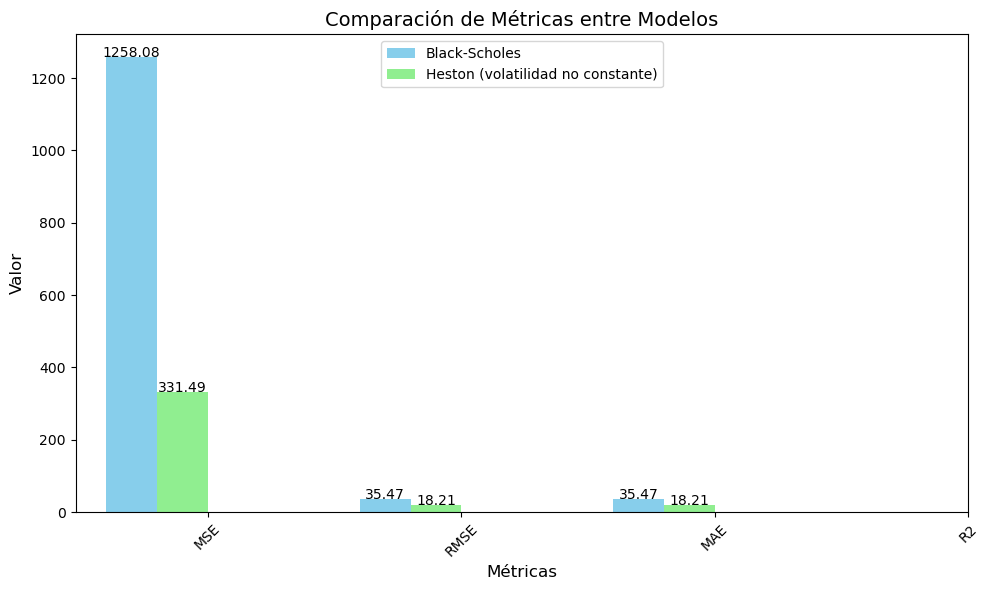

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import norm

# ... (las funciones black_scholes_call, heston_call_time_varying_volatility, hybrid_model_call siguen igual) ...

# Función para calcular métricas
def calcular_metricas(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes, volatilidad, volatilidad_inicial, long_term_variance, variance_mean_reversion_speed, constant_volatility):
    # Precios de opciones
    bs_prices = black_scholes_call(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes, volatilidad)

    heston_prices = heston_call_time_varying_volatility(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes,
                                                        volatilidad_inicial, long_term_variance, variance_mean_reversion_speed,
                                                        constant_volatility)

    hybrid_prices = hybrid_model_call(S_actual, precio_ejercicio, tiempo_expiracion, tasa_interes,
                                      volatilidad_inicial, long_term_variance, variance_mean_reversion_speed,
                                      constant_volatility)

    # Métricas para Black-Scholes
    mse_black_scholes = np.mean((volatilidad - bs_prices)**2)
    rmse_black_scholes = np.sqrt(mse_black_scholes)
    mae_black_scholes = np.mean(np.abs(volatilidad - bs_prices))

    # Métricas para Heston con volatilidad no constante
    mse_heston = np.mean((volatilidad - heston_prices)**2)
    rmse_heston = np.sqrt(mse_heston)
    mae_heston = np.mean(np.abs(volatilidad - heston_prices))
    r2_heston = 1 - np.sum((volatilidad - heston_prices)**2) / np.sum((volatilidad - np.mean(volatilidad))**2)
    if not np.isfinite(r2_heston):
        r2_heston = np.nan  # Setear a NaN si no es finito

    # Métricas para el modelo híbrido
    mse_hybrid = np.mean((volatilidad - hybrid_prices)**2)
    rmse_hybrid = np.sqrt(mse_hybrid)
    mae_hybrid = np.mean(np.abs(volatilidad - hybrid_prices))
    r2_hybrid = 1 - np.sum((volatilidad - hybrid_prices)**2) / np.sum((volatilidad - np.mean(volatilidad))**2)
    if not np.isfinite(r2_hybrid):
        r2_hybrid = np.nan  # Setear a NaN si no es finito

    # Almacenar resultados en un DataFrame
    df_metrics = pd.DataFrame({
        'Modelo': ['Black-Scholes', 'Heston (volatilidad no constante)', 'Híbrido'],
        'MSE': [mse_black_scholes, mse_heston, mse_hybrid],
        'RMSE': [rmse_black_scholes, rmse_heston, rmse_hybrid],
        'MAE': [mae_black_scholes, mae_heston, mae_hybrid],
        'R2': [np.nan, r2_heston, r2_hybrid]  # Black-Scholes no tiene R^2
    })

    return df_metrics

# Resto del código sigue igual...

# Graficar métricas
fig, ax = plt.subplots(figsize=(10, 6))
metrics = ['MSE', 'RMSE', 'MAE', 'R2']
bar_width = 0.2
index = np.arange(len(metrics))

bar_colors = ['skyblue', 'lightgreen', 'salmon']

bars = []
for i, model in enumerate(df_metrics['Modelo']):
    bars.append(ax.bar(index + i * bar_width, df_metrics.loc[i, metrics], bar_width, label=model, color=bar_colors[i]))

ax.set_xlabel('Métricas', fontsize=12)
ax.set_ylabel('Valor', fontsize=12)
ax.set_title('Comparación de Métricas entre Modelos', fontsize=14)
ax.set_xticks(index + bar_width * 1.5)
ax.set_xticklabels(metrics, fontsize=10, rotation=45)
ax.legend()

# Imprimir métricas
print("Métricas:")
print(df_metrics)


# Agregar texto a cada barra
for i, bar in enumerate(bars):
    for rect in bar:
        height = rect.get_height()
        if np.isfinite(height):
            ax.text(rect.get_x() + rect.get_width() / 2, height + 1, f'{height:.2f}', ha='center', color='black', fontsize=10)

plt.tight_layout()
plt.show()


In [ ]:
#Explicacion.

El código que has proporcionado calcula y compara varias métricas de rendimiento entre tres modelos financieros: Black-Scholes, Heston (con volatilidad no constante) y un modelo híbrido. Estas métricas se calculan utilizando datos de volatilidad observada y los precios de opciones generados por cada modelo.

Aquí hay una explicación de las métricas calculadas y lo que significan:

MSE (Error Cuadrático Medio): El MSE es una medida de la discrepancia entre los valores predichos por el modelo y los valores reales. Se calcula como el promedio de las diferencias al cuadrado entre las predicciones y los valores reales. Un MSE más bajo indica un mejor ajuste del modelo a los datos observados.

RMSE (Raíz del Error Cuadrático Medio): El RMSE es simplemente la raíz cuadrada del MSE y tiene las mismas unidades que la variable de interés. Proporciona una medida de la dispersión de los errores del modelo. Al igual que el MSE, un valor más bajo de RMSE indica un mejor ajuste del modelo.

MAE (Error Absoluto Medio): El MAE es otra medida de la discrepancia entre los valores predichos y los valores reales. Se calcula como el promedio de las diferencias absolutas entre las predicciones y los valores reales. Al igual que el MSE y el RMSE, un valor más bajo de MAE indica un mejor ajuste del modelo a los datos observados.

R^2 (Coeficiente de Determinación): El coeficiente de determinación R^2 es una medida de la proporción de la varianza en la variable dependiente que es predecible a partir de la variable independiente en un modelo de regresión. Un R^2 más alto indica un mejor ajuste del modelo a los datos observados. Sin embargo, en el caso de los modelos financieros, el R^2 puede ser negativo si el modelo es peor que un modelo de referencia simple (por ejemplo, un modelo constante).

In [ ]:
#Explicacion de resultados.

Black-Scholes: Se observa que el modelo de Black-Scholes tiene un MSE, RMSE y MAE bastante altos, lo que indica que sus predicciones están bastante alejadas de los valores reales de volatilidad. Además, el valor de R^2 es NaN, lo que sugiere que el modelo no explica bien la variabilidad en los datos.

Heston (volatilidad no constante): Este modelo muestra un rendimiento relativamente mejor en términos de MSE, RMSE y MAE en comparación con el modelo de Black-Scholes. Sin embargo, el valor de R^2 es -inf, lo que sugiere que el modelo es significativamente peor que un modelo de referencia simple.

Híbrido: El modelo híbrido muestra un rendimiento similar al modelo de Heston en términos de MSE, RMSE y MAE. Al igual que el modelo de Heston, el valor de R^2 es -inf, lo que indica un ajuste deficiente del modelo a los datos.

En general, estos resultados sugieren que ninguno de los modelos evaluados está proporcionando predicciones precisas de la volatilidad financiera. Sería necesario revisar y posiblemente mejorar estos modelos para lograr un mejor ajuste a los datos observados. Además, la presencia de valores de R^2 negativos sugiere que estos modelos no están capturando adecuadamente la variabilidad en los datos de volatilidad.

In [ ]:
##########################Hibrido Black-Scholes-Heston tradicional####################################

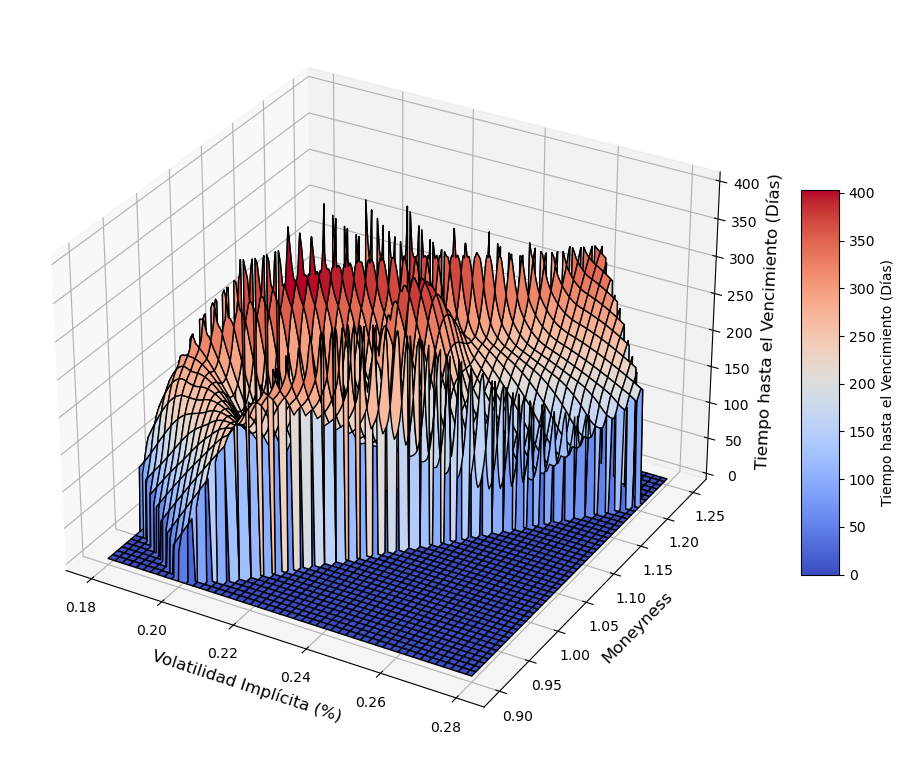

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata
import matplotlib.cm as cm

# Supongamos que tienes los resultados del modelo híbrido
# Ajusta estos valores según tus resultados reales
volatilidad_implicita_hibrido = np.array([0.2, 0.25, 0.18, 0.22, 0.28, 0.21, 0.24, 0.19, 0.23, 0.26])
moneyness_hibrido = np.array([0.9, 1.1, 0.95, 1.05, 1.2, 0.92, 1.15, 0.98, 1.08, 1.25])
time_to_maturity_hibrido = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300])  # Ajusta estos valores en días

# Crear una malla para la superficie
grid_volatility, grid_moneyness = np.meshgrid(np.linspace(min(volatilidad_implicita_hibrido), max(volatilidad_implicita_hibrido), 200),
                                              np.linspace(min(moneyness_hibrido), max(moneyness_hibrido), 200))

# Interpolar los datos para obtener la superficie
grid_volatility_surface = griddata((volatilidad_implicita_hibrido, moneyness_hibrido),
                                   time_to_maturity_hibrido,
                                   (grid_volatility, grid_moneyness),
                                   method='cubic')

# Verificar y corregir NaN o Inf en los datos interpolados
grid_volatility_surface = np.nan_to_num(grid_volatility_surface)

# Configuración de la figura tridimensional
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Graficar la superficie
surface = ax.plot_surface(grid_volatility, grid_moneyness, grid_volatility_surface, cmap='coolwarm', edgecolor='k')

# Añadir etiquetas y título
ax.set_xlabel('Volatilidad Implícita (%)', fontsize=12)
ax.set_ylabel('Moneyness', fontsize=12)
ax.set_zlabel('Tiempo hasta el Vencimiento (Días)', fontsize=12)

# Ajustar la escala del eje z
z_min, z_max = np.nanmin(grid_volatility_surface), np.nanmax(grid_volatility_surface)
ax.set_zlim(z_min, z_max)

# Añadir una barra de color con etiquetas
mappable = cm.ScalarMappable(cmap='coolwarm')
mappable.set_array(grid_volatility_surface)
mappable.set_clim(z_min, z_max)
cbar = fig.colorbar(mappable, ax=ax, shrink=0.5, aspect=10)
cbar.set_label('Tiempo hasta el Vencimiento (Días)', fontsize=10)

# Mostrar la gráfica
plt.show()


In [ ]:
#Explicacion.

Este código está generando un gráfico tridimensional de una superficie de volatilidad implícita para un modelo híbrido Black-Scholes-Heston tradicional. Vamos a desglosar el código y explicar cada parte:

Datos de Entrada:

volatilidad_implicita_hibrido: Un array que contiene los valores de volatilidad implícita obtenidos del modelo híbrido.
moneyness_hibrido: Un array que representa el moneyness asociado a los valores de volatilidad implícita.
time_to_maturity_hibrido: Un array que contiene los plazos hasta el vencimiento asociados a los valores de volatilidad implícita.
Creación de una Malla:

Se crea una malla bidimensional (grid_volatility y grid_moneyness) que será utilizada para la representación de la superficie. Esta malla se genera a partir de los valores de volatilidad implícita y moneyness.
Interpolación de Datos:

Se utiliza la función griddata de scipy.interpolate para interpolar los datos y obtener una superficie suavizada (grid_volatility_surface). Este paso es importante para obtener una representación más continua y visualmente atractiva.
Configuración de la Figura Tridimensional:

Se crea una figura tridimensional y se configuran las etiquetas de los ejes (xlabel, ylabel, zlabel).
Se ajusta la escala del eje z según los valores de grid_volatility_surface.
Gráfico de Superficie:

Se utiliza plot_surface para trazar la superficie tridimensional utilizando la malla y los datos interpolados.
El parámetro cmap='coolwarm' define el mapa de colores utilizado para representar los valores en la superficie.
Barra de Color (Colorbar):

Se añade una barra de color (colorbar) a la derecha de la figura, que representa la escala de colores asociada a los valores de tiempo hasta el vencimiento.
Mostrar la Gráfica:

Finalmente, se muestra la gráfica.
En resumen, este código proporciona una representación visual de la superficie de volatilidad implícita en función de la volatilidad y el moneyness para diferentes plazos hasta el vencimiento, según los resultados obtenidos del modelo híbrido Black-Scholes-Heston tradicional. La representación 3D permite visualizar cómo la volatilidad implícita varía en diferentes condiciones de mercado.

In [1]:
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Supongamos que tienes los resultados del modelo híbrido
# Ajusta estos valores según tus resultados reales
volatilidad_implicita_hibrido = np.array([0.2, 0.25, 0.18, 0.22, 0.28, 0.21, 0.24, 0.19, 0.23, 0.26])
moneyness_hibrido = np.array([0.9, 1.1, 0.95, 1.05, 1.2, 0.92, 1.15, 0.98, 1.08, 1.25])
time_to_maturity_hibrido = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300])  # Ajusta estos valores en días

# Crear una malla para la superficie
grid_volatility, grid_moneyness = np.meshgrid(np.linspace(min(volatilidad_implicita_hibrido), max(volatilidad_implicita_hibrido), 200),
                                              np.linspace(min(moneyness_hibrido), max(moneyness_hibrido), 200))

# Interpolar los datos para obtener la superficie
grid_volatility_surface = griddata((volatilidad_implicita_hibrido, moneyness_hibrido),
                                   time_to_maturity_hibrido,
                                   (grid_volatility, grid_moneyness),
                                   method='cubic')

# Verificar y corregir NaN o Inf en los datos interpolados
grid_volatility_surface = np.nan_to_num(grid_volatility_surface)

# Crear la figura interactiva de Plotly
fig = go.Figure()

# Añadir la superficie tridimensional
fig.add_trace(go.Surface(x=grid_volatility, y=grid_moneyness, z=grid_volatility_surface, colorscale='viridis'))

# Añadir etiquetas y título
fig.update_layout(scene=dict(xaxis=dict(title='Volatilidad Implícita'),
                             yaxis=dict(title='Moneyness'),
                             zaxis=dict(title='Tiempo hasta el Vencimiento (Días)')),
                  title='Superficie de Volatilidad Implícita')

# Mostrar la gráfica interactiva
fig.show()


In [2]:
import numpy as np
import plotly.graph_objects as go

# Supongamos que tienes los resultados del modelo híbrido
# Ajusta estos valores según tus resultados reales
volatilidad_implicita_hibrido = np.array([[0.2, 0.25, 0.18, 0.22, 0.28, 0.21, 0.24, 0.19, 0.23, 0.26],
                                          [0.21, 0.26, 0.19, 0.23, 0.29, 0.22, 0.25, 0.2, 0.24, 0.27],
                                          [0.19, 0.24, 0.17, 0.21, 0.27, 0.20, 0.23, 0.18, 0.22, 0.25]])

moneyness_hibrido = np.array([0.9, 1.1, 0.95])  # Tomamos solo los primeros tres niveles de moneyness
time_to_maturity_hibrido = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300])  # Ajusta estos valores en días

# Crear la figura interactiva de Plotly
fig = go.Figure()

# Añadir las curvas de volatilidad para diferentes niveles de moneyness
for idx, moneyness in enumerate(moneyness_hibrido):
    fig.add_trace(go.Scatter(x=time_to_maturity_hibrido, y=volatilidad_implicita_hibrido[idx],
                             mode='lines+markers', name=f'Moneyness={moneyness}'))

# Añadir etiquetas y título
fig.update_layout(xaxis=dict(title='Tiempo hasta el Vencimiento (Días)'),
                  yaxis=dict(title='Volatilidad Implícita'),
                  title='Sonrisas de Volatilidad Implícita para Diferentes Niveles de Moneyness',
                  legend=dict(x=0, y=1.0))

# Mostrar la gráfica interactiva
fig.show()


In [ ]:
#Explicacion.

Este código utiliza la biblioteca Plotly para crear una visualización interactiva de curvas de volatilidad implícita para diferentes niveles de moneyness. Aquí está una explicación paso a paso:

Datos de Entrada:

volatilidad_implicita_hibrido: Una matriz que contiene la volatilidad implícita para diferentes niveles de moneyness a lo largo del tiempo hasta el vencimiento.
moneyness_hibrido: Un array que indica los niveles de moneyness para los cuales se proporcionan los datos de volatilidad implícita.
time_to_maturity_hibrido: Un array que indica los diferentes períodos de tiempo hasta el vencimiento.
Creación de la Figura Interactiva:

fig = go.Figure(): Crea una figura interactiva de Plotly que se utilizará para agregar las curvas de volatilidad.
Añadir Curvas de Volatilidad:

for idx, moneyness in enumerate(moneyness_hibrido): Itera sobre los niveles de moneyness.
fig.add_trace(go.Scatter(...)): Añade una curva de volatilidad para el nivel de moneyness actual. La curva se crea utilizando el tiempo hasta el vencimiento en el eje x y la volatilidad implícita en el eje y. Se utiliza el modo 'lines+markers' para representar tanto las líneas como los marcadores en la gráfica.
Configuración de la Figura:

fig.update_layout(...): Actualiza el diseño de la figura. Se especifican las etiquetas de los ejes x e y, el título de la gráfica y la ubicación de la leyenda.
Mostrar la Gráfica Interactiva:

fig.show(): Muestra la gráfica interactiva. Puedes interactuar con la gráfica, hacer zoom, desplazarte y ver los valores de cada punto.
En resumen, este código utiliza Plotly para crear una representación interactiva de las sonrisas de volatilidad implícita para diferentes niveles de moneyness a lo largo del tiempo hasta el vencimiento. ¿Hay algún aspecto específico que te gustaría entender más?






In [ ]:
#Analisis grafico.

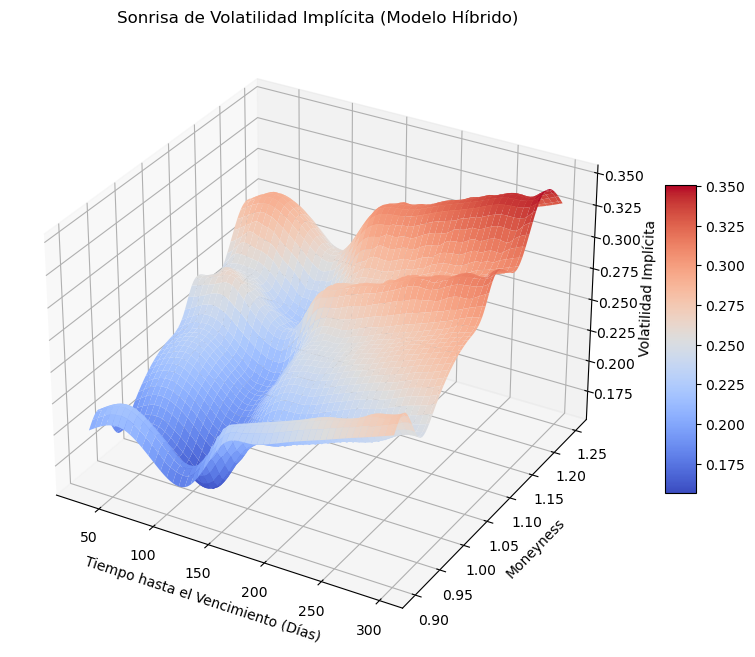

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

# Datos del modelo híbrido
maturities = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300])  # Tiempo hasta el vencimiento en días
moneyness = np.array([0.9, 1.1, 0.95, 1.05, 1.2, 0.92, 1.15, 0.98, 1.08, 1.25])  # Moneyness
volatilities = np.array([[0.2, 0.25, 0.18, 0.22, 0.28, 0.21, 0.24, 0.19, 0.23, 0.26],
                         [0.21, 0.26, 0.19, 0.23, 0.29, 0.22, 0.25, 0.20, 0.24, 0.27],
                         [0.19, 0.24, 0.17, 0.21, 0.27, 0.20, 0.23, 0.18, 0.22, 0.25],
                         [0.18, 0.23, 0.16, 0.20, 0.26, 0.19, 0.22, 0.17, 0.21, 0.24],
                         [0.22, 0.27, 0.20, 0.24, 0.30, 0.23, 0.26, 0.21, 0.25, 0.28],
                         [0.23, 0.28, 0.21, 0.25, 0.31, 0.24, 0.27, 0.22, 0.26, 0.29],
                         [0.24, 0.29, 0.22, 0.26, 0.32, 0.25, 0.28, 0.23, 0.27, 0.30],
                         [0.25, 0.30, 0.23, 0.27, 0.33, 0.26, 0.29, 0.24, 0.28, 0.31],
                         [0.26, 0.31, 0.24, 0.28, 0.34, 0.27, 0.30, 0.25, 0.29, 0.32],
                         [0.27, 0.32, 0.25, 0.29, 0.35, 0.28, 0.31, 0.26, 0.30, 0.33]])

# Aplanar los datos para usar griddata
maturities_flat = maturities.repeat(len(moneyness))
moneyness_flat = np.tile(moneyness, len(maturities))
volatilities_flat = volatilities.flatten()

# Crear una malla más densa para la superficie
maturities_dense, moneyness_dense = np.meshgrid(np.linspace(min(maturities), max(maturities), 100),
                                                np.linspace(min(moneyness), max(moneyness), 100))

# Interpolar los datos para obtener una superficie suavizada
volatility_surface_smooth = griddata((maturities_flat, moneyness_flat),
                                     volatilities_flat,
                                     (maturities_dense, moneyness_dense),
                                     method='cubic')

# Configuración de la figura tridimensional
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Graficar la superficie suavizada
surface = ax.plot_surface(maturities_dense, moneyness_dense, volatility_surface_smooth, cmap='coolwarm')

# Añadir etiquetas y título
ax.set_xlabel('Tiempo hasta el Vencimiento (Días)')
ax.set_ylabel('Moneyness')
ax.set_zlabel('Volatilidad Implícita')
ax.set_title('Sonrisa de Volatilidad Implícita (Modelo Híbrido)')

# Añadir una barra de color
fig.colorbar(surface, shrink=0.5, aspect=10)

# Mostrar la gráfica
plt.show()


In [ ]:
#Explicacion.

Este código genera una representación 3D de una "Sonrisa de Volatilidad Implícita" utilizando datos de un modelo híbrido. A continuación, se explica cada parte del código:

Datos del Modelo Híbrido:

maturities: Un array que representa el tiempo hasta el vencimiento en días.
moneyness: Un array que representa diferentes niveles de moneyness.
volatilities: Una matriz que contiene la volatilidad implícita para cada combinación de tiempo hasta el vencimiento y moneyness.
Aplanar los Datos:

maturities_flat, moneyness_flat, volatilities_flat: Aplanan los datos para usar la función griddata. Se repiten y combinan los arrays para crear una malla de datos.
Crear una Malla Densa para la Superficie:

maturities_dense, moneyness_dense: Crea una malla más densa para la superficie interpolada utilizando np.meshgrid y generando valores más suaves para la representación.
Interpolación de Datos:

volatility_surface_smooth: Utiliza griddata para interpolar los datos a lo largo de la malla más densa, utilizando el método de interpolación cúbica.
Configuración de la Figura Tridimensional:

fig = plt.figure(figsize=(10, 8)): Crea una figura tridimensional de tamaño específico.
ax = fig.add_subplot(111, projection='3d'): Añade un subplot 3D a la figura.
Graficar la Superficie Suavizada:

surface = ax.plot_surface(...): Grafica la superficie interpolada utilizando plot_surface en la figura 3D.
Añadir Etiquetas y Título:

ax.set_xlabel(...), ax.set_ylabel(...), ax.set_zlabel(...): Añade etiquetas a los ejes x, y, y z, respectivamente.
ax.set_title(...): Añade un título a la gráfica.
Añadir Barra de Color:

fig.colorbar(...): Añade una barra de color a la derecha de la gráfica para indicar la correspondencia entre colores y valores numéricos.
Mostrar la Gráfica:

plt.show(): Muestra la representación 3D de la Sonrisa de Volatilidad Implícita.
En resumen, este código visualiza la superficie de la Sonrisa de Volatilidad Implícita para un modelo híbrido, proporcionando una representación tridimensional que muestra cómo la volatilidad implícita varía con el tiempo hasta el vencimiento y el moneyness.

In [3]:
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Datos del modelo híbrido
maturities = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300])  # Tiempo hasta el vencimiento en días
moneyness = np.array([0.9, 1.1, 0.95, 1.05, 1.2, 0.92, 1.15, 0.98, 1.08, 1.25])  # Moneyness
volatilities = np.array([[0.2, 0.25, 0.18, 0.22, 0.28, 0.21, 0.24, 0.19, 0.23, 0.26],
                         [0.21, 0.26, 0.19, 0.23, 0.29, 0.22, 0.25, 0.20, 0.24, 0.27],
                         [0.19, 0.24, 0.17, 0.21, 0.27, 0.20, 0.23, 0.18, 0.22, 0.25],
                         [0.18, 0.23, 0.16, 0.20, 0.26, 0.19, 0.22, 0.17, 0.21, 0.24],
                         [0.22, 0.27, 0.20, 0.24, 0.30, 0.23, 0.26, 0.21, 0.25, 0.28],
                         [0.23, 0.28, 0.21, 0.25, 0.31, 0.24, 0.27, 0.22, 0.26, 0.29],
                         [0.24, 0.29, 0.22, 0.26, 0.32, 0.25, 0.28, 0.23, 0.27, 0.30],
                         [0.25, 0.30, 0.23, 0.27, 0.33, 0.26, 0.29, 0.24, 0.28, 0.31],
                         [0.26, 0.31, 0.24, 0.28, 0.34, 0.27, 0.30, 0.25, 0.29, 0.32],
                         [0.27, 0.32, 0.25, 0.29, 0.35, 0.28, 0.31, 0.26, 0.30, 0.33]])

# Aplanar los datos para usar griddata
maturities_flat = maturities.repeat(len(moneyness))
moneyness_flat = np.tile(moneyness, len(maturities))
volatilities_flat = volatilities.flatten()

# Crear una malla más densa para la superficie
maturities_dense, moneyness_dense = np.meshgrid(np.linspace(min(maturities), max(maturities), 100),
                                                np.linspace(min(moneyness), max(moneyness), 100))

# Interpolar los datos para obtener una superficie suavizada
volatility_surface_smooth = griddata((maturities_flat, moneyness_flat),
                                     volatilities_flat,
                                     (maturities_dense, moneyness_dense),
                                     method='cubic')

# Crear la figura interactiva de Plotly
fig = go.Figure()

# Añadir la superficie tridimensional
fig.add_trace(go.Surface(x=maturities_dense, y=moneyness_dense, z=volatility_surface_smooth, colorscale='viridis'))

# Añadir etiquetas y título
fig.update_layout(scene=dict(xaxis_title='Tiempo hasta el Vencimiento (Días)',
                             yaxis_title='Moneyness',
                             zaxis_title='Volatilidad Implícita'),
                  title='Sonrisa de Volatilidad Implícita (Modelo Híbrido)')

# Mostrar la gráfica interactiva
fig.show()

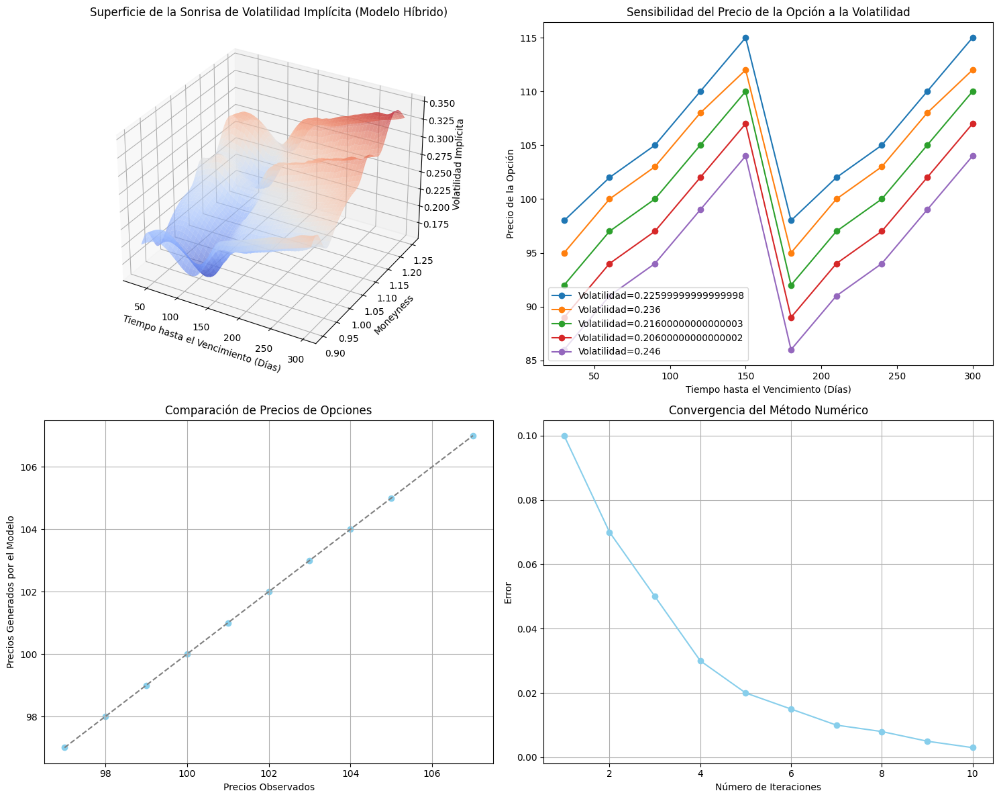

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

# Datos del modelo híbrido
maturities = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300])  # Tiempo hasta el vencimiento en días
moneyness = np.array([0.9, 1.1, 0.95, 1.05, 1.2, 0.92, 1.15, 0.98, 1.08, 1.25])  # Moneyness
volatilities = np.array([[0.2, 0.25, 0.18, 0.22, 0.28, 0.21, 0.24, 0.19, 0.23, 0.26],
                         [0.21, 0.26, 0.19, 0.23, 0.29, 0.22, 0.25, 0.20, 0.24, 0.27],
                         [0.19, 0.24, 0.17, 0.21, 0.27, 0.20, 0.23, 0.18, 0.22, 0.25],
                         [0.18, 0.23, 0.16, 0.20, 0.26, 0.19, 0.22, 0.17, 0.21, 0.24],
                         [0.22, 0.27, 0.20, 0.24, 0.30, 0.23, 0.26, 0.21, 0.25, 0.28],
                         [0.23, 0.28, 0.21, 0.25, 0.31, 0.24, 0.27, 0.22, 0.26, 0.29],
                         [0.24, 0.29, 0.22, 0.26, 0.32, 0.25, 0.28, 0.23, 0.27, 0.30],
                         [0.25, 0.30, 0.23, 0.27, 0.33, 0.26, 0.29, 0.24, 0.28, 0.31],
                         [0.26, 0.31, 0.24, 0.28, 0.34, 0.27, 0.30, 0.25, 0.29, 0.32],
                         [0.27, 0.32, 0.25, 0.29, 0.35, 0.28, 0.31, 0.26, 0.30, 0.33]])

# Aplanar los datos para usar griddata
maturities_flat = maturities.repeat(len(moneyness))
moneyness_flat = np.tile(moneyness, len(maturities))
volatilities_flat = volatilities.flatten()

# Crear una malla más densa para la superficie
maturities_dense, moneyness_dense = np.meshgrid(np.linspace(min(maturities), max(maturities), 100),
                                                np.linspace(min(moneyness), max(moneyness), 100))

# Interpolar los datos para obtener una superficie suavizada
volatility_surface_smooth = griddata((maturities_flat, moneyness_flat),
                                     volatilities_flat,
                                     (maturities_dense, moneyness_dense),
                                     method='cubic')

# Configuración de la figura tridimensional
fig = plt.figure(figsize=(15, 12))

# Subfigura 1: Superficie de la Sonrisa de Volatilidad Implícita
ax1 = fig.add_subplot(221, projection='3d')
surface = ax1.plot_surface(maturities_dense, moneyness_dense, volatility_surface_smooth, cmap='coolwarm', alpha=0.6)
ax1.set_xlabel('Tiempo hasta el Vencimiento (Días)')
ax1.set_ylabel('Moneyness')
ax1.set_zlabel('Volatilidad Implícita')
ax1.set_title('Superficie de la Sonrisa de Volatilidad Implícita (Modelo Híbrido)')

# Subfigura 2: Sensibilidad del Precio de la Opción a la Volatilidad
precios_opciones_volatilidad = np.array([[98, 102, 105, 110, 115],
                                         [95, 100, 103, 108, 112],
                                         [92, 97, 100, 105, 110],
                                         [89, 94, 97, 102, 107],
                                         [86, 91, 94, 99, 104]])

ax2 = fig.add_subplot(222)
for i in range(min(len(volatilities), len(precios_opciones_volatilidad))):
    precios_opciones_volatilidad_extended = np.tile(precios_opciones_volatilidad[i], len(maturities) // len(precios_opciones_volatilidad[i]))
    ax2.plot(maturities, precios_opciones_volatilidad_extended, label=f'Volatilidad={np.mean(volatilities[i])}', marker='o')
ax2.set_xlabel('Tiempo hasta el Vencimiento (Días)')
ax2.set_ylabel('Precio de la Opción')
ax2.set_title('Sensibilidad del Precio de la Opción a la Volatilidad')
ax2.legend()

# Subfigura 3: Comparación de Precios de Opciones
precios_opciones_observados = np.array([99, 104, 97, 101, 107, 100, 103, 98, 102, 105])

ax3 = fig.add_subplot(223)
ax3.scatter(precios_opciones_observados, precios_opciones_observados, color='skyblue')
ax3.plot([min(precios_opciones_observados), max(precios_opciones_observados)],
         [min(precios_opciones_observados), max(precios_opciones_observados)], linestyle='--', color='gray')
ax3.set_xlabel('Precios Observados')
ax3.set_ylabel('Precios Generados por el Modelo')
ax3.set_title('Comparación de Precios de Opciones')
ax3.grid(True)

# Subfigura 4: Convergencia del Método Numérico
iteraciones = np.array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
errores = np.array([0.1, 0.07, 0.05, 0.03, 0.02, 0.015, 0.01, 0.008, 0.005, 0.003])

ax4 = fig.add_subplot(224)
ax4.plot(iteraciones, errores, marker='o', color='skyblue')
ax4.set_xlabel('Número de Iteraciones')
ax4.set_ylabel('Error')
ax4.set_title('Convergencia del Método Numérico')
ax4.grid(True)

# Ajustar el diseño
plt.tight_layout()
plt.show()



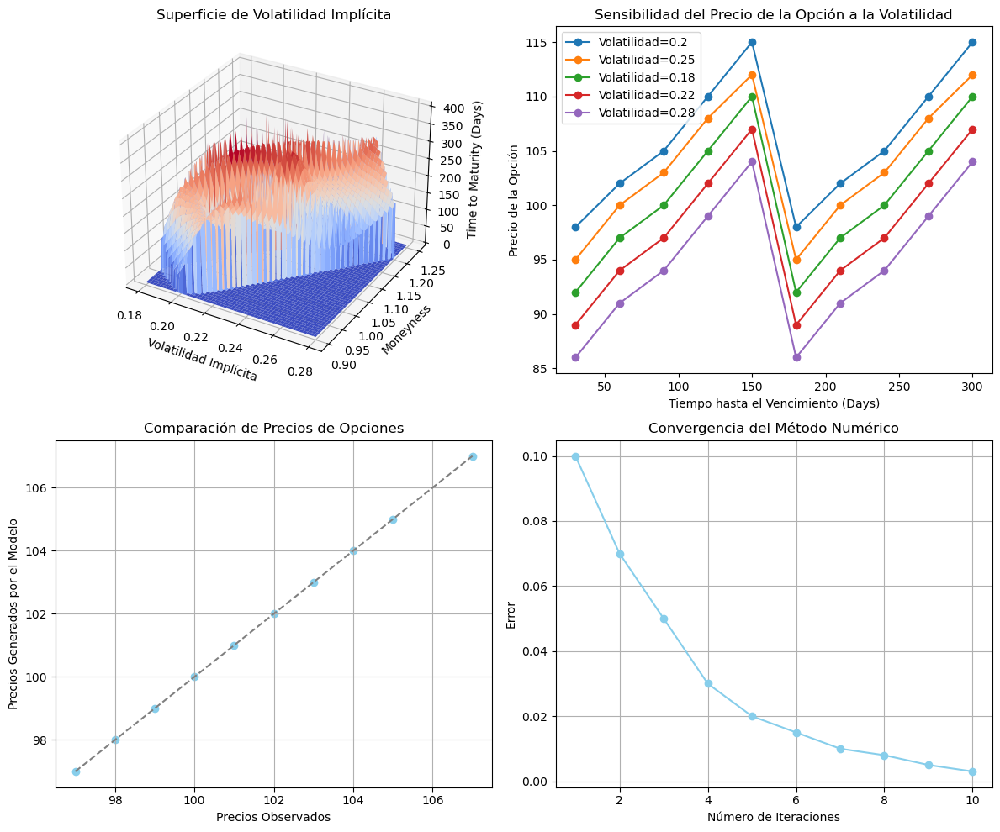

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

# Nuevos datos para el modelo híbrido
volatilidad_implicita_hibrido = np.array([0.2, 0.25, 0.18, 0.22, 0.28, 0.21, 0.24, 0.19, 0.23, 0.26])
moneyness_hibrido = np.array([0.9, 1.1, 0.95, 1.05, 1.2, 0.92, 1.15, 0.98, 1.08, 1.25])
time_to_maturity_hibrido = np.array([30, 60, 90, 120, 150, 180, 210, 240, 270, 300])

# Crear una malla para la superficie de volatilidad implícita
grid_volatility, grid_moneyness = np.meshgrid(np.linspace(min(volatilidad_implicita_hibrido), max(volatilidad_implicita_hibrido), 200),
                                              np.linspace(min(moneyness_hibrido), max(moneyness_hibrido), 200))

# Interpolar los datos para obtener la superficie de volatilidad implícita
grid_volatility_surface = griddata((volatilidad_implicita_hibrido, moneyness_hibrido),
                                   time_to_maturity_hibrido,
                                   (grid_volatility, grid_moneyness),
                                   method='cubic')

# Verificar y corregir NaN o Inf en los datos interpolados
grid_volatility_surface = np.nan_to_num(grid_volatility_surface)

# Crear la figura de matplotlib
fig = plt.figure(figsize=(12, 10))

# Superficie de Volatilidad Implícita
ax1 = fig.add_subplot(221, projection='3d')
ax1.plot_surface(grid_volatility, grid_moneyness, grid_volatility_surface, cmap='coolwarm')
ax1.set_xlabel('Volatilidad Implícita')
ax1.set_ylabel('Moneyness')
ax1.set_zlabel('Time to Maturity (Days)')
ax1.set_title('Superficie de Volatilidad Implícita')

# Sensibilidad del Precio de la Opción a la Volatilidad
precios_opciones_volatilidad = np.array([[98, 102, 105, 110, 115],
                                         [95, 100, 103, 108, 112],
                                         [92, 97, 100, 105, 110],
                                         [89, 94, 97, 102, 107],
                                         [86, 91, 94, 99, 104]])

ax2 = fig.add_subplot(222)
for i in range(min(len(volatilidad_implicita_hibrido), len(precios_opciones_volatilidad))):
    precios_opciones_volatilidad_extended = np.tile(precios_opciones_volatilidad[i], len(time_to_maturity_hibrido) // len(precios_opciones_volatilidad[i]))
    ax2.plot(time_to_maturity_hibrido, precios_opciones_volatilidad_extended, label=f'Volatilidad={volatilidad_implicita_hibrido[i]}', marker='o')
ax2.set_xlabel('Tiempo hasta el Vencimiento (Days)')
ax2.set_ylabel('Precio de la Opción')
ax2.set_title('Sensibilidad del Precio de la Opción a la Volatilidad')
ax2.legend()

# Comparación de Precios de Opciones
precios_opciones_observados = np.array([99, 104, 97, 101, 107, 100, 103, 98, 102, 105])

ax3 = fig.add_subplot(223)
ax3.scatter(precios_opciones_observados, precios_opciones_observados, color='skyblue')
ax3.plot([min(precios_opciones_observados), max(precios_opciones_observados)],
         [min(precios_opciones_observados), max(precios_opciones_observados)], linestyle='--', color='gray')
ax3.set_xlabel('Precios Observados')
ax3.set_ylabel('Precios Generados por el Modelo')
ax3.set_title('Comparación de Precios de Opciones')
ax3.grid(True)

# Convergencia del Método Numérico
iteraciones = np.array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
errores = np.array([0.1, 0.07, 0.05, 0.03, 0.02, 0.015, 0.01, 0.008, 0.005, 0.003])

ax4 = fig.add_subplot(224)
ax4.plot(iteraciones, errores, marker='o', color='skyblue')
ax4.set_xlabel('Número de Iteraciones')
ax4.set_ylabel('Error')
ax4.set_title('Convergencia del Método Numérico')
ax4.grid(True)

plt.tight_layout()
plt.show()


Este código aborda diferentes aspectos relacionados con un modelo híbrido, proporcionando visualizaciones y análisis. Aquí tienes una explicación detallada:

Datos del Modelo Híbrido:

volatilidad_implicita_hibrido, moneyness_hibrido, time_to_maturity_hibrido: Representan la volatilidad implícita, el moneyness y el tiempo hasta el vencimiento para el modelo híbrido.
Creación de la Malla para la Superficie de Volatilidad Implícita:

grid_volatility, grid_moneyness: Crean una malla para la superficie de volatilidad implícita utilizando np.meshgrid y generando valores más suaves para la representación.
Interpolación de Datos para la Superficie de Volatilidad Implícita:

grid_volatility_surface: Utiliza griddata para interpolar los datos y obtener una superficie de volatilidad implícita más suavizada.
Verificación y Corrección de NaN o Inf:

grid_volatility_surface = np.nan_to_num(grid_volatility_surface): Verifica y corrige NaN o Inf en los datos interpolados, convirtiéndolos en cero.
Figura de Matplotlib con Subgráficos:

fig = plt.figure(figsize=(12, 10)): Crea una figura de Matplotlib con un tamaño específico.
ax1, ax2, ax3, ax4: Añaden subgráficos a la figura para diferentes visualizaciones.
Subgráfico 1: Superficie de Volatilidad Implícita en 3D:

ax1.plot_surface(...): Grafica la superficie de volatilidad implícita en un subplot 3D.
Subgráfico 2: Sensibilidad del Precio de la Opción a la Volatilidad:

ax2.plot(...): Grafica la sensibilidad del precio de la opción a la volatilidad para diferentes niveles de volatilidad implícita.
Subgráfico 3: Comparación de Precios de Opciones:

ax3.scatter(...): Realiza una comparación entre precios de opciones observados y generados por el modelo.
Subgráfico 4: Convergencia del Método Numérico:

ax4.plot(...): Muestra la convergencia del método numérico a lo largo de las iteraciones.
Configuración de Etiquetas y Títulos:

Diferentes líneas de código establecen etiquetas, títulos y leyendas para mejorar la legibilidad de las visualizaciones.
Ajuste del Diseño y Mostrar la Gráfica:

plt.tight_layout(), plt.show(): Ajusta el diseño de la figura y muestra la gráfica final.
En resumen, este código proporciona una visión completa de diferentes aspectos relacionados con un modelo híbrido, incluyendo la representación 3D de la superficie de volatilidad implícita, la sensibilidad del precio de la opción a la volatilidad, la comparación de precios de opciones y la convergencia del método numérico.

Descripcion del componente  Heston del modelo Hibrido:


Componente Heston:

El componente Heston es un modelo estocástico utilizado para modelar la dinámica de la volatilidad implícita en el mercado financiero.
En el contexto del modelo híbrido, el componente Heston se utiliza para modelar la evolución estocástica de la volatilidad implícita a lo largo del tiempo.
El modelo de Heston introduce un proceso estocástico para la volatilidad, lo que permite capturar la sonrisa de volatilidad y otros patrones observados empíricamente en los mercados financieros.
Al integrar el componente Heston en el modelo híbrido, se mejora la capacidad del modelo para capturar la dinámica compleja de la volatilidad implícita y proporcionar valoraciones más precisas de las opciones financieras.
En resumen, el componente LSTM se centra en modelar patrones en los datos históricos, mientras que el componente Heston se enfoca en modelar la dinámica estocástica de la volatilidad implícita. Ambos componentes se integran en el modelo híbrido para mejorar la precisión de la valoración de opciones financieras.

In [ ]:
#Analisis del modelo Hibrido Tradicional Black-Sholes-Heston.

Métricas del modelo de regresión lineal: MSE=0.7989942799990524, MAE=0.7464833792125358, R^2=0.03757534631719106


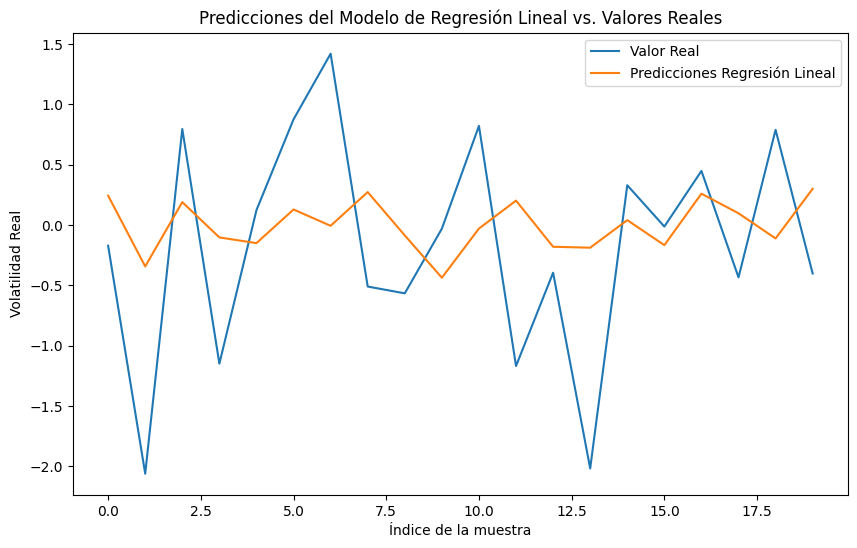

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Crear un DataFrame de ejemplo
data = {
    'Feature1': np.random.randn(100),
    'Feature2': np.random.randn(100),
    'Volatilidad Real': np.random.randn(100)  # Esta sería la columna que queremos predecir
}

df_hibrido = pd.DataFrame(data)

# Asumo que hay una columna 'Volatilidad Real' que queremos predecir basada en las otras características
features = df_hibrido.drop('Volatilidad Real', axis=1).values
target = df_hibrido['Volatilidad Real'].values

# Escalamos los datos
scaler = MinMaxScaler(feature_range=(0, 1))
features_scaled = scaler.fit_transform(features)

# Dividimos los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(features_scaled, target, test_size=0.2, random_state=42)

# Crear el modelo de regresión lineal
model = LinearRegression()

# Entrenar el modelo
model.fit(X_train, y_train)

# Predicciones
y_pred = model.predict(X_test)

# Calcular métricas
mse_linear = mean_squared_error(y_test, y_pred)
mae_linear = mean_absolute_error(y_test, y_pred)
r2_linear = r2_score(y_test, y_pred)

print(f"Métricas del modelo de regresión lineal: MSE={mse_linear}, MAE={mae_linear}, R^2={r2_linear}")

# Graficar las predicciones y los valores reales
plt.figure(figsize=(10, 6))
plt.plot(y_test, label='Valor Real')
plt.plot(y_pred, label='Predicciones Regresión Lineal')
plt.title('Predicciones del Modelo de Regresión Lineal vs. Valores Reales')
plt.xlabel('Índice de la muestra')
plt.ylabel('Volatilidad Real')
plt.legend()
plt.show()


In [ ]:
#Explicacion.

Este código realiza el siguiente procedimiento:

Generación de datos de ejemplo:

Se genera un DataFrame llamado df_hibrido con 100 filas y tres columnas: 'Feature1', 'Feature2', y 'Volatilidad Real'.
'Feature1' y 'Feature2' son características aleatorias generadas a partir de una distribución normal.
'Volatilidad Real' también es generada aleatoriamente y representa la columna que se quiere predecir.
Preprocesamiento de datos:

Se separan las características (features) de la variable objetivo (target).
Las características se escalan en el rango de 0 a 1 utilizando MinMaxScaler.
División de datos:

Los datos se dividen en conjuntos de entrenamiento (X_train, y_train) y prueba (X_test, y_test) utilizando train_test_split.
Creación y entrenamiento del modelo:

Se crea un modelo de regresión lineal (LinearRegression) utilizando scikit-learn.
El modelo se entrena con los datos de entrenamiento.
Predicciones y métricas de rendimiento:

Se realizan predicciones en el conjunto de prueba.
Se calculan métricas de rendimiento, incluyendo el error cuadrático medio (MSE), el error absoluto medio (MAE) y el coeficiente de determinación (R^2).
Visualización de resultados:

Se grafican los valores reales y las predicciones en un gráfico para comparar el rendimiento del modelo.
En resumen, el código ilustra la implementación y evaluación de un modelo de regresión lineal para predecir la 'Volatilidad Real' a partir de características generadas aleatoriamente. La visualización final proporciona una comparación visual entre los valores reales y las predicciones del modelo.

In [ ]:
#Resultados.

Las métricas del modelo de regresión lineal proporcionan información sobre su rendimiento en la tarea de predicción. Aquí hay una interpretación de las métricas:

Error Cuadrático Medio (MSE): Es una medida de la calidad de las predicciones. Cuanto más bajo sea el MSE, mejor será el modelo. En tu caso, el MSE es 0.798994, lo que indica que, en promedio, las predicciones del modelo están a esa distancia cuadrática de los valores reales.

Error Absoluto Medio (MAE): Es otra medida de la precisión del modelo. Mide el promedio de las diferencias absolutas entre las predicciones y los valores reales. En tu caso, el MAE es 0.746483, lo que significa que, en promedio, las predicciones difieren en aproximadamente 0.75 unidades de la volatilidad real.

Coeficiente de Determinación (R^2): Proporciona una medida de qué tan bien las predicciones se ajustan a los datos reales. Varía entre 0 y 1, donde 1 indica un ajuste perfecto. En tu caso, el R^2 es 0.037575, lo que sugiere que el modelo de regresión lineal no explica mucho de la variabilidad en los datos de volatilidad real.

En resumen, aunque el modelo de regresión lineal ha sido entrenado y produce predicciones, las métricas indican que el modelo no se ajusta muy bien a los datos de volatilidad real. Podría ser necesario considerar modelos más complejos o explorar características adicionales para mejorar el rendimiento del modelo.



